# Data Analysis

## Locating & Importing Data

### Library for data analysis

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import math
import os

### Data Location

In [165]:
curr_location = os.getcwd()
raw_data_dir = 'Data'
raw_data_name = 'Customer Data.csv'
raw_data_path = os.path.join(curr_location, raw_data_dir, raw_data_name)

dataset_dir =  'Dataset'
dataset_path = os.path.join(curr_location, dataset_dir)

### Import Data

In [4]:
raw_data = pd.read_csv(raw_data_path)
raw_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


## Data Exploration

### Function in Data Exploration

In [31]:
def plot_heatmap(data, column=None, fig_size=[15, 15], scale=None, label=None):

    plt.figure(figsize=fig_size)
    if column == None:
        if scale == None:
            sns.heatmap(data, annot=label)
        elif type(scale) == type([]):
            sns.heatmap(data, annot=label, vmax=scale[0], vmin=scale[1])
    elif type(column) == type([]):
        if scale == None:
            sns.heatmap(data[column], annot=label)
        elif type(scale) == type([]):
            sns.heatmap(data[column], annot=label, vmax=scale[0], vmin=scale[1])
    plt.show()

In [143]:
def plot_scatter(data, column=None, fig_size=[15, 15], label=None):

    plt.figure(figsize=fig_size)
    if column == None:
        sns.pairplot(data, hue=label)
    elif type(column) == type([]):
        sns.pairplot(data[column], hue=label)
    plt.show()

In [138]:
def plot_histogram(data, col_data=None, row=None, column=None, axis=0, kde=None, fig_size=[24, 24], label=None):

    count = 0
    if col_data is None:
        col_data = data.columns.tolist()
        if row is None and column is None:
            col_amount = len(col_data)
            column = 3
            row = math.ceil(col_amount/column)
        fig, ax = plt.subplots(nrows=row, ncols=column, figsize=fig_size)
        if axis == 0:
            for x in range(0, row):
                for y in range(0, column):
                    if count < col_amount:
                        sns.histplot(data = data, x = col_data[count], kde=True, hue=label, ax=ax[x][y])  
                    count += 1      
    plt.show()

In [137]:
def plot_quartilebox(data, col_data=None, row=None, column=None, axis=0, kde=None, fig_size=[24, 24], label=None):

    count = 0
    if col_data is None:
        col_data = data.columns.tolist()
        if row is None and column is None:
            col_amount = len(col_data)
            column = 3
            row = math.ceil(col_amount/column)
        fig, ax = plt.subplots(nrows=row, ncols=column, figsize=fig_size)
        if axis == 0:
            for x in range(0, row):
                for y in range(0, column):
                    if count < col_amount:
                        sns.boxplot(data = data, x = col_data[count], hue=label, ax=ax[x][y])       
                    count += 1 
    plt.show()

<font size = "4">
<b>In this dataset has 18 attributes and the following attributes are the usage behavior summary of about 9000 active credit cardholders during the last 6 months.</b>
<font size = "2">
<br>

- CUST_ID : Credit card holder ID <br>
- BALANCE : Monthly average balance (based on daily balance averages) <br>
- BALANCE_FREQUENCY : Ratio of last 12 months with balance <br>
- PURCHASES : Total purchase amount spent during last 12 months <br>
- ONEOFF_PURCHASES : Total amount of one-off purchases <br>
- INSTALLMENTS_PURCHASES : Total amount of installment purchases <br>
- CASH_ADVANCE : Total cash-advance amount <br>
- PURCHASES_FREQUENCY : Frequency of purchases (percentage of months with at least one purchase) <br>
- ONEOFF_PURCHASES_FREQUENCY : Frequency of one-off-purchases <br>
- PURCHASES_INSTALLMENTS_FREQUENCY : Frequency of installment purchases <br>
- CASH_ADVANCE_FREQUENCY : Cash-Advance frequency <br>
- CASH_ADVANCE_TRX : Average amount per cash-advance transaction <br>
- PURCHASES_TRX : Average amount per purchase transaction <br>
- CREDIT_LIMIT : Credit limit <br>
- PAYMENTS : Total payments (due amount paid by the customer to decrease their statement balance) in the period <br>
- MINIMUM_PAYMENTS : Total minimum payments due in the period. <br>
- PRC_FULL_PAYMENT : Percentage of months with full payment of the due statement balance <br>
- TENURE : Number of months as a customer <br>

</font>

In [5]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

Following the result from the info function of pandas, we realized that the dataset has missing values in some attribute and the Attribute name CUST_ID is a categorical attribute which represent index of dataset.

#### Cleaning Data

In [6]:
cutted_raw_data = raw_data.drop(['CUST_ID'], axis=1)
print(cutted_raw_data.isna().sum().sum())
cleaned_data = cutted_raw_data.dropna().reindex().copy()
cleaned_data.isna().sum().sum()

314


0

In [7]:
cleaned_data_column = cleaned_data.columns.tolist()
cleaned_data.columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

### Objective

<font size = "3">
Following the description of the dataset, we can summarize the data to be requirment, being our primary objective. <br>
<font size = "1">
<br>
</font>
<u>Our objective</u> : To increase insurance market value of insurance advertisement using credit card customer data.
</font>

In [8]:
cleaned_data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


##### Correlation between 2 attributes in data.

In [9]:
cleaned_data_correlation = cleaned_data.corr()
cleaned_data_correlation.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000
mean,0.243276,0.178600,0.344767,0.290028,0.282007,0.166082,0.235854,0.243390,0.204538,0.110617,0.149742,0.327281,0.273186,0.316696,0.142693,0.073971,0.102138
std,0.301665,0.232744,0.341911,0.323666,0.299913,0.359501,0.367745,0.293077,0.350196,0.391556,0.360895,0.314933,0.231438,0.248461,0.245823,0.304605,0.242927
min,-0.333594,-0.156961,-0.124863,-0.086413,-0.136455,-0.218566,-0.316771,-0.118225,-0.268924,-0.316771,-0.208749,-0.136913,0.052578,0.039169,-0.140404,-0.333594,-0.140038
25%,0.066987,0.095254,0.093842,0.063400,0.114739,-0.078449,0.002979,0.063832,0.030036,-0.136913,-0.073384,0.118889,0.126671,0.104668,0.048741,-0.156961,0.052161
50%,0.176083,0.132519,0.316025,0.159985,0.211829,-0.033244,0.228158,0.187467,0.128380,-0.086413,-0.045350,0.273715,0.258057,0.255921,0.098844,0.104668,0.066987
75%,0.398669,0.184159,0.606782,0.524514,0.441193,0.459342,0.441193,0.497384,0.316025,0.182340,0.255921,0.545313,0.320613,0.426951,0.132156,0.176447,0.102986
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


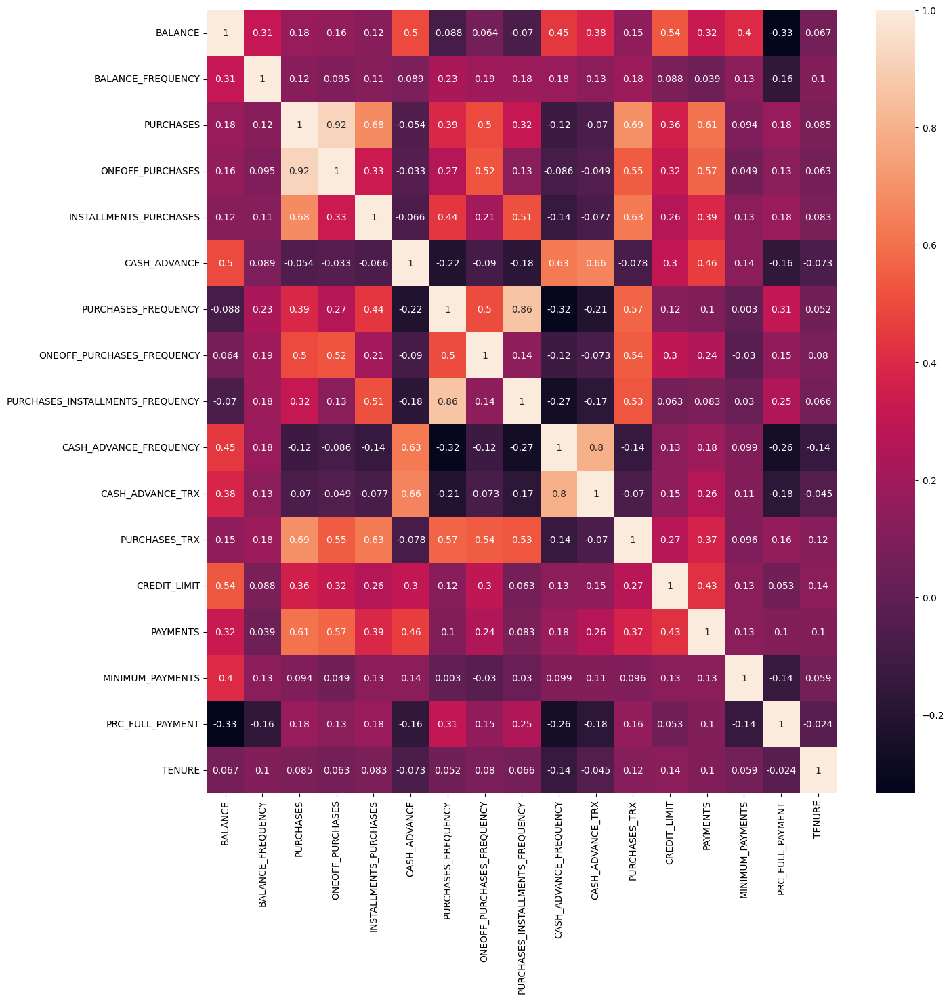

In [28]:
plot_heatmap(cleaned_data_correlation, label=True)

##### Explore about pairing between 2 attributes in data.

<Figure size 1500x1500 with 0 Axes>

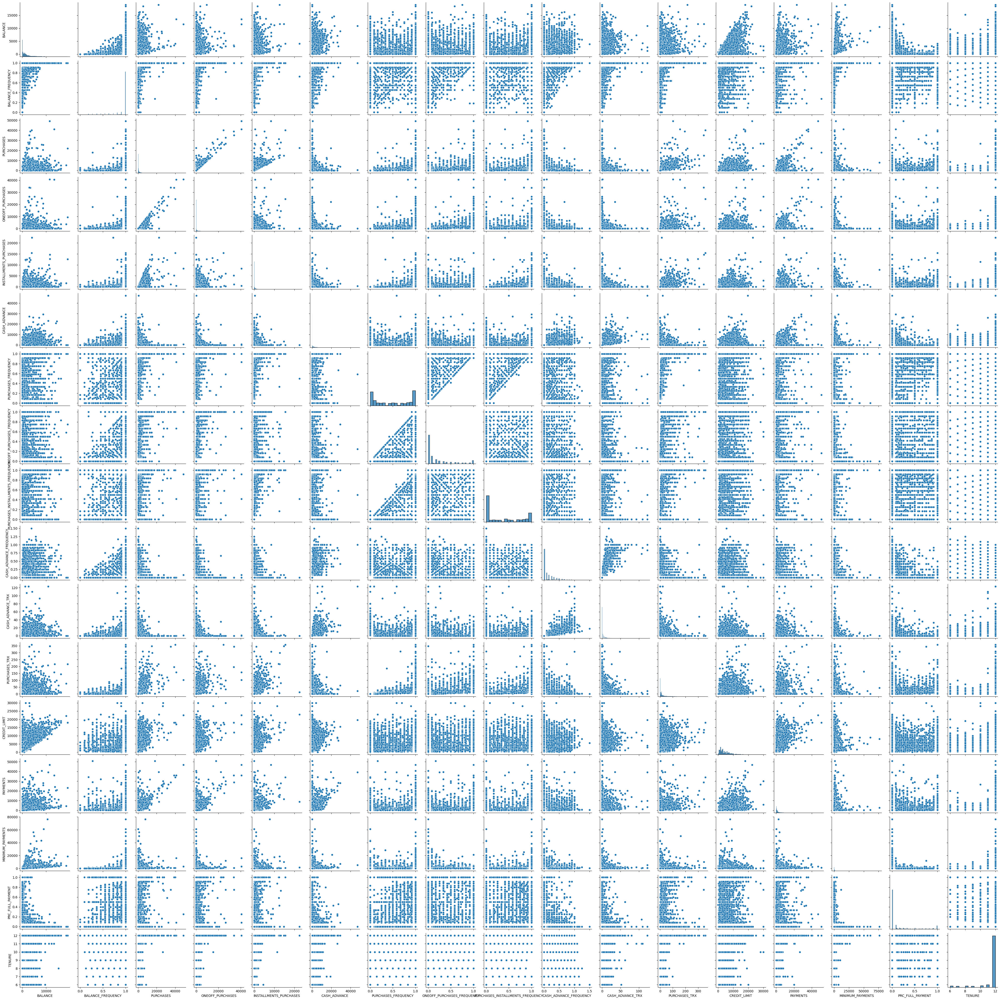

In [34]:
plot_scatter(cleaned_data)

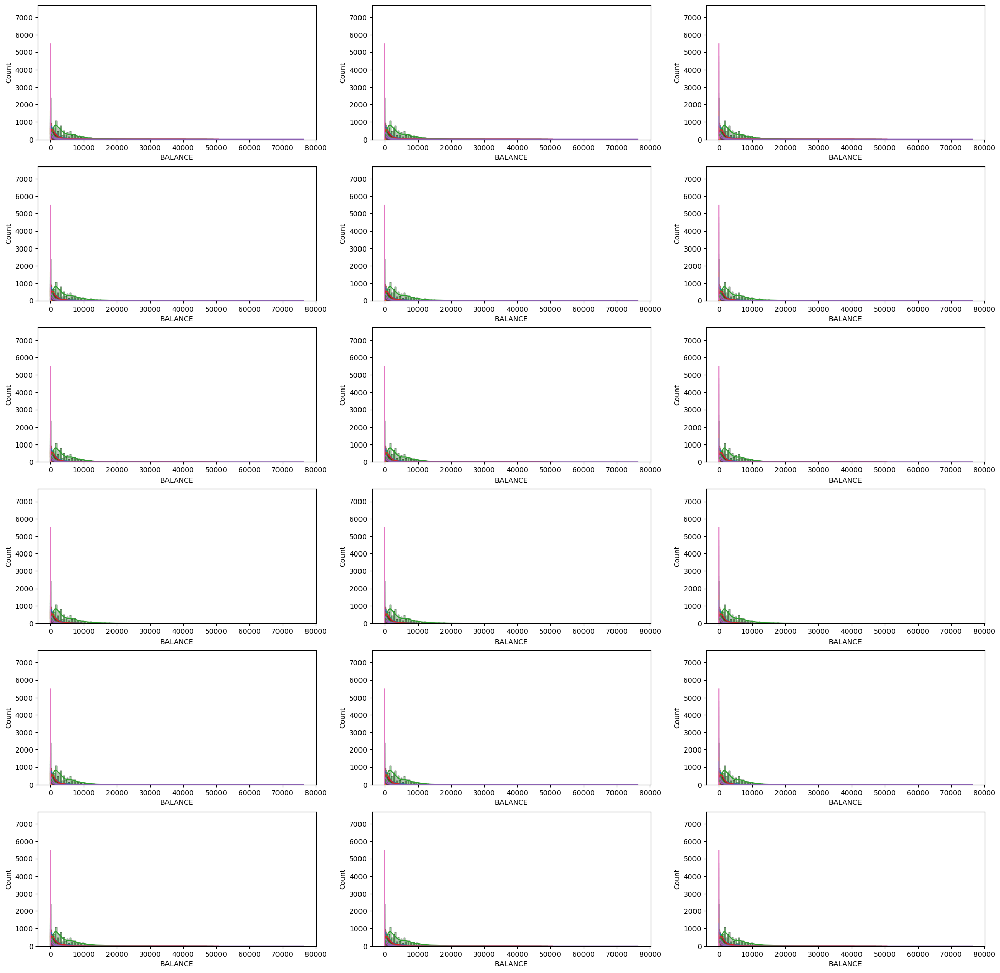

In [128]:
plot_histogram(data=cleaned_data)

From the correlation value in data table and data pairing plot, we realized that dataset has low correlation, many out-liner data and some data are skewed and non-symmetric bi-modal.

-----------------------------------------------------------------------------------------------

### Our Assumption

#### Assumption 1

The Correlation that represented from dataset using graph plot or calculate correlation value between two attribute can clust the behavior group of customer.

In the data exploration of assumption 1 starts with the numerical attributes in dataset, being the continuous values. Reason that we start with the numerical attributes because we want to find out the possiblility between 2 attributes that can clust the group.

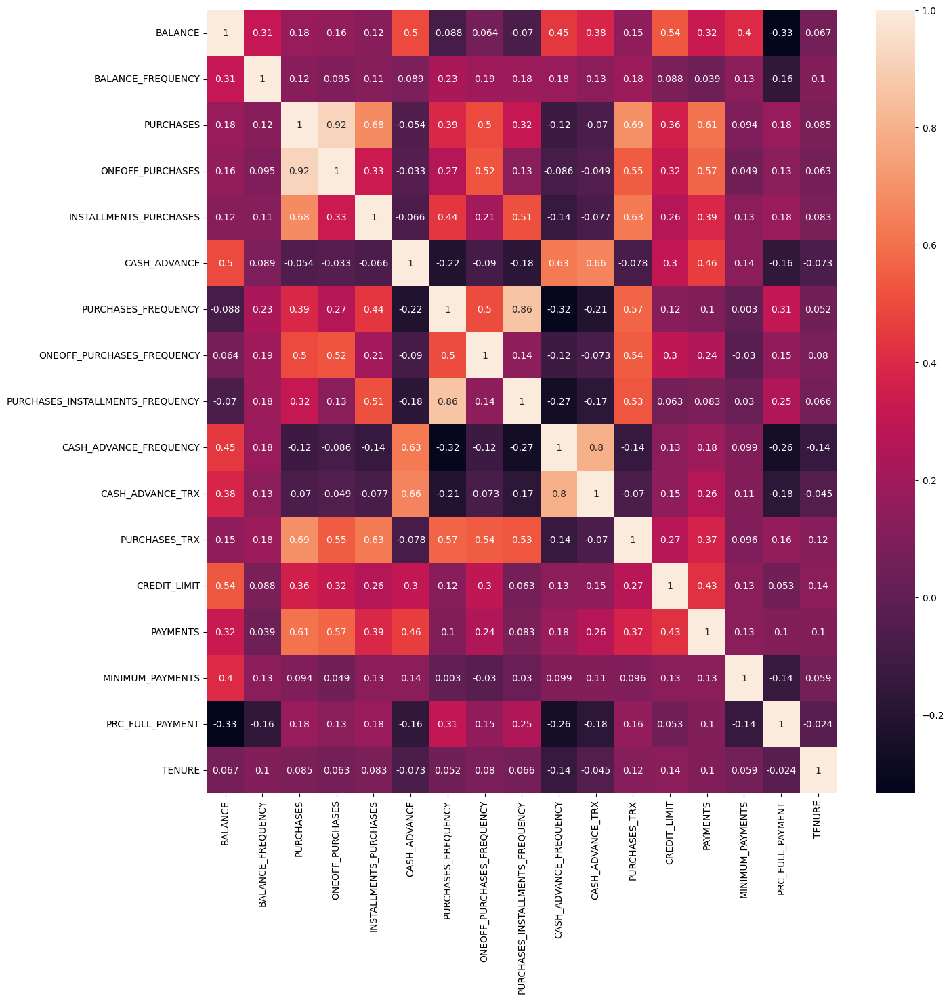

In [ ]:
plot_heatmap(cleaned_data_correlation, label=True)

From ploting heatmap we found first 8 attributes, having high correlation value.

- 0.92 : purchase & one-off purchase
- 0.86 : purchase frequency & purchase installment frequency
- 0.80 : cash advance frequency & cash advance TRX
- 0.69 : purchase & purchase TRX
- 0.68 : purchase & installment purchase
- 0.66 : cash advance & cash advance TRX
- 0.63 : cash advance & cash advance frequency
- 0.61 : payment & purchase

At the same time, we knew that a similar attribute name has a high correlation in the definition such as PURCHASES, ONEOFF_PURCHASES, INSTALLMENTS_PURCHASES, etc., and all of the examples relate to credit card purchases in each type.

<Figure size 1500x1500 with 0 Axes>

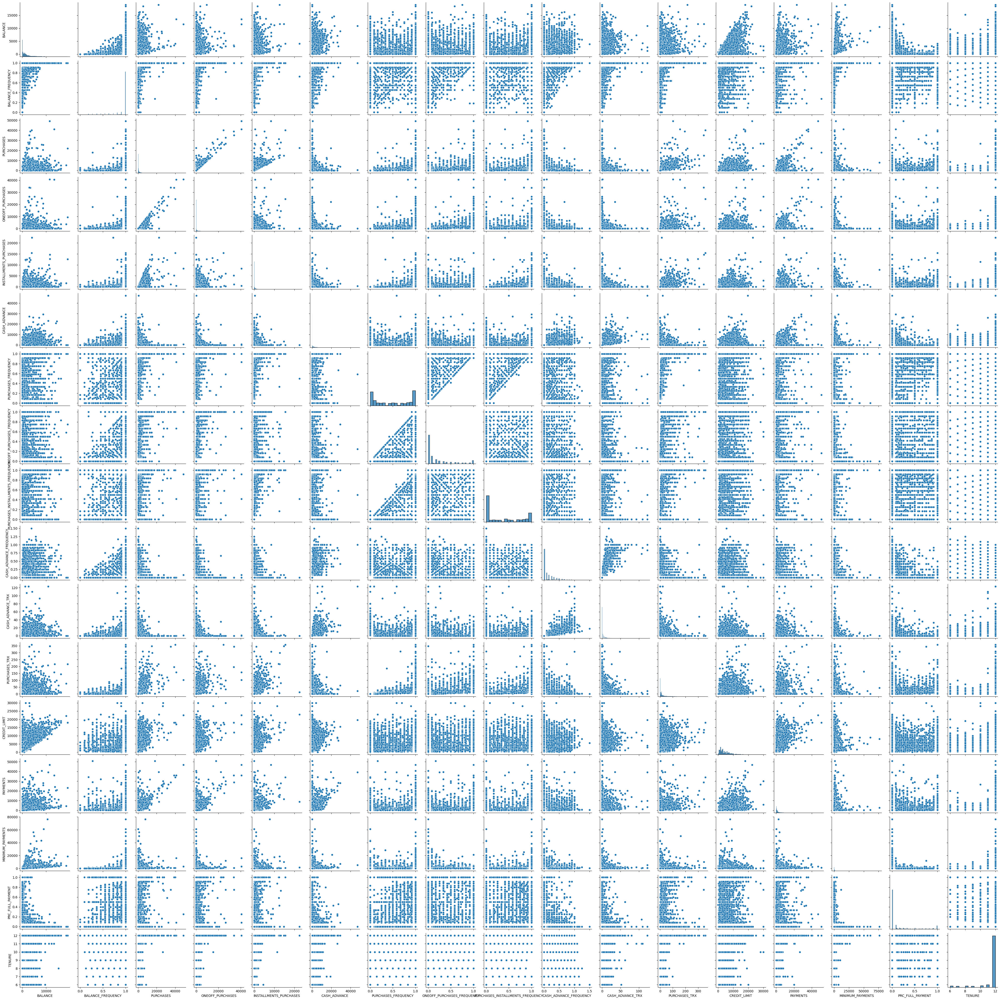

In [145]:
plot_scatter(cleaned_data)

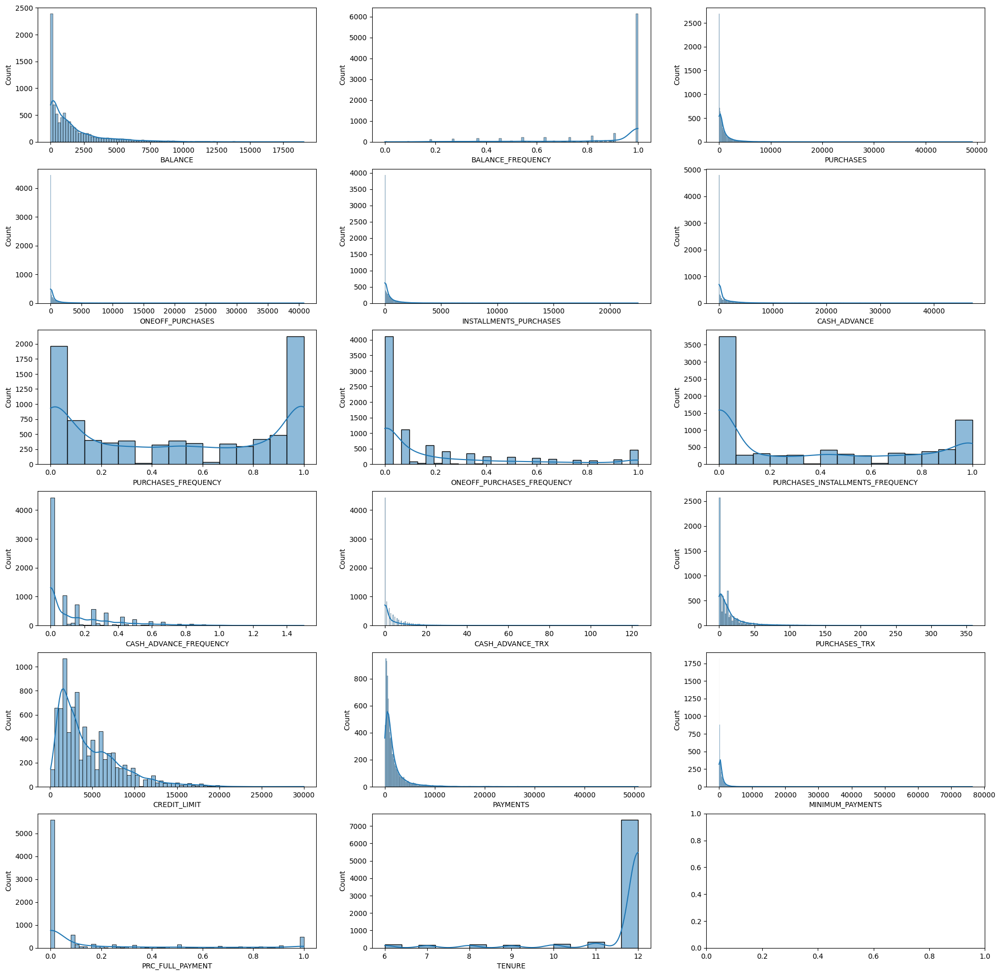

In [139]:
plot_histogram(data=cleaned_data)

From scatter and histogram plot, we found the similarity of distribution characteristics in each attribute that is left-skewed type data. In addition, Each attribute has extensive zero values.

----------------------------------------------------------------------------------------------------------

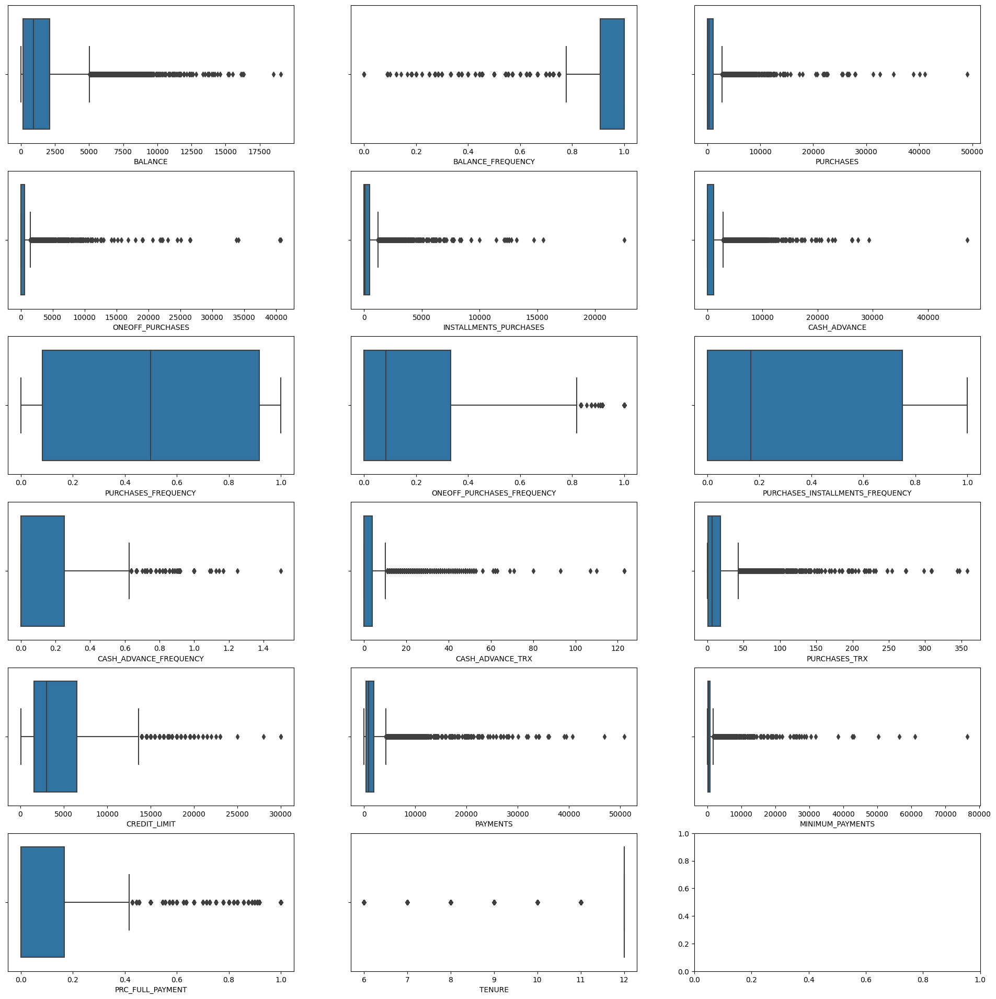

In [140]:
plot_quartilebox(data=cleaned_data)

From the box plot, we found a large number of outliner data in each attribute. Even so, we don't remove outliner data because removing outliner data may affect some feature of data that can represent some specific cluster.

-------------------------------------------------------------------------------------------------------

After Data Exploration, we select 6 attributes that relate to credit card usage to find out the cluster of credit card usage behavior in each customer.

In [154]:
assum1_selected_data = cleaned_data[['PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'PAYMENTS', 'PURCHASES', 'BALANCE']]
assum1_selected_data

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
0,0.166667,0.000000,0.083333,0.000000,201.802084,95.40,40.900749
1,0.000000,0.000000,0.000000,0.250000,4103.032597,0.00,3202.467416
2,1.000000,1.000000,0.000000,0.000000,622.066742,773.17,2495.148862
4,0.083333,0.083333,0.000000,0.000000,678.334763,16.00,817.714335
5,0.666667,0.000000,0.583333,0.000000,1400.057770,1333.28,1809.828751
...,...,...,...,...,...,...,...
8943,0.166667,0.166667,0.000000,0.000000,58.644883,20.90,5.871712
8945,1.000000,0.000000,0.833333,0.000000,325.594462,291.12,28.493517
8947,0.833333,0.000000,0.666667,0.000000,81.270775,144.40,23.398673
8948,0.000000,0.000000,0.000000,0.166667,52.549959,0.00,13.457564


In [155]:
assum1_selected_data.describe()

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,0.496000,0.205909,0.368820,0.137604,1784.478099,1025.433874,1601.224893
std,0.401273,0.300054,0.398093,0.201791,2909.810090,2167.107984,2095.571300
min,0.000000,0.000000,0.000000,0.000000,0.049513,0.000000,0.000000
25%,0.083333,0.000000,0.000000,0.000000,418.559237,43.367500,148.095189
50%,0.500000,0.083333,0.166667,0.000000,896.675701,375.405000,916.855459
75%,0.916667,0.333333,0.750000,0.250000,1951.142090,1145.980000,2105.195853
max,1.000000,1.000000,1.000000,1.500000,50721.483360,49039.570000,19043.138560


After selecting the important data, we create the scatter plot to find out the relation between 2 datas that seperate class with another data.

<Figure size 1500x1500 with 0 Axes>

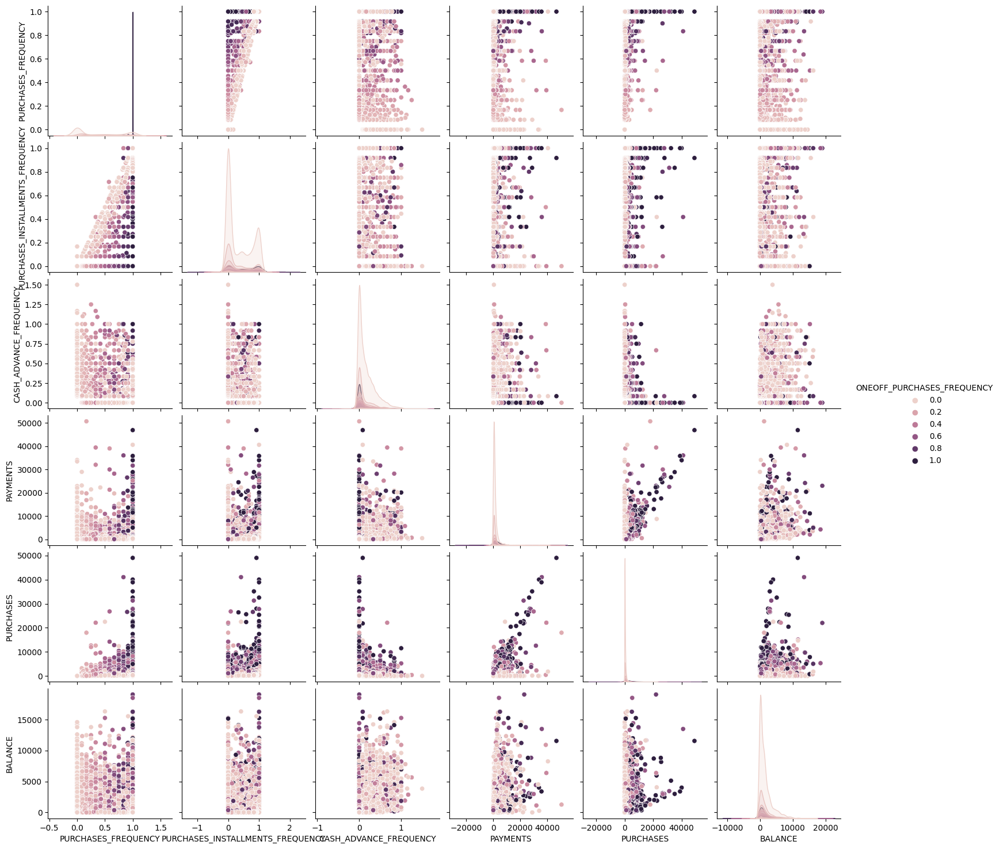

In [156]:
plot_scatter(assum1_selected_data, label="ONEOFF_PURCHASES_FREQUENCY")

<Figure size 1500x1500 with 0 Axes>

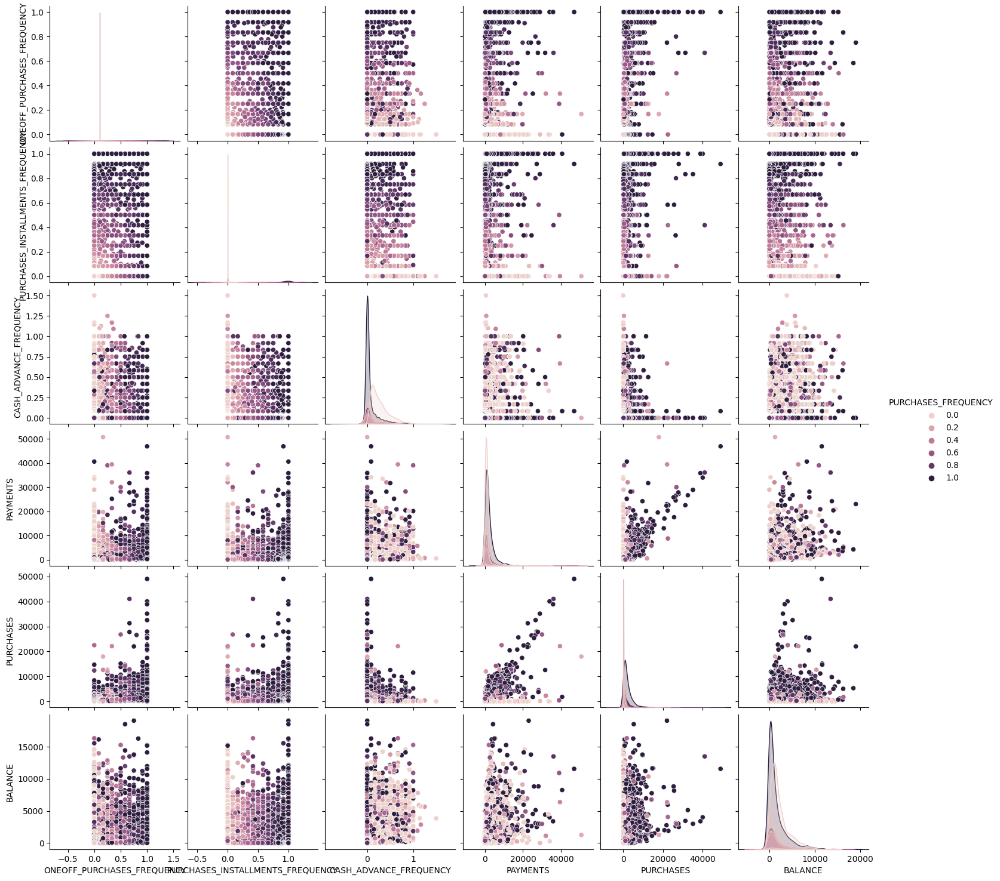

In [157]:
plot_scatter(assum1_selected_data, label="PURCHASES_FREQUENCY")

<Figure size 1500x1500 with 0 Axes>

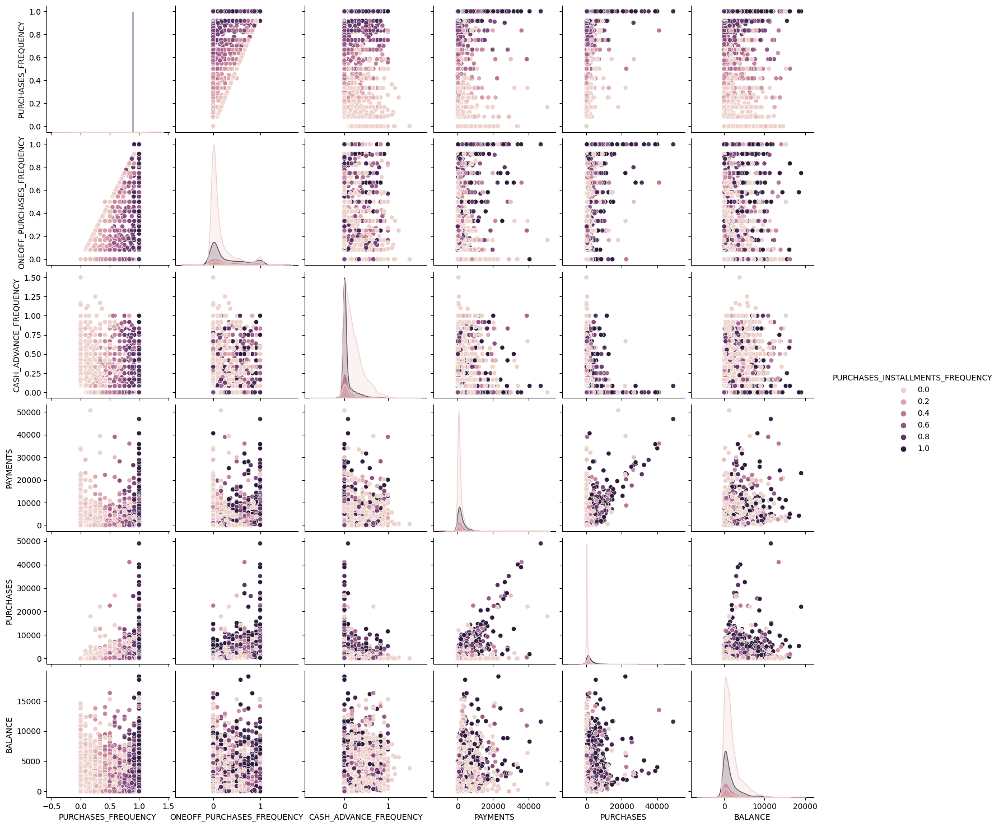

In [158]:
plot_scatter(assum1_selected_data, label="PURCHASES_INSTALLMENTS_FREQUENCY")

<Figure size 1500x1500 with 0 Axes>

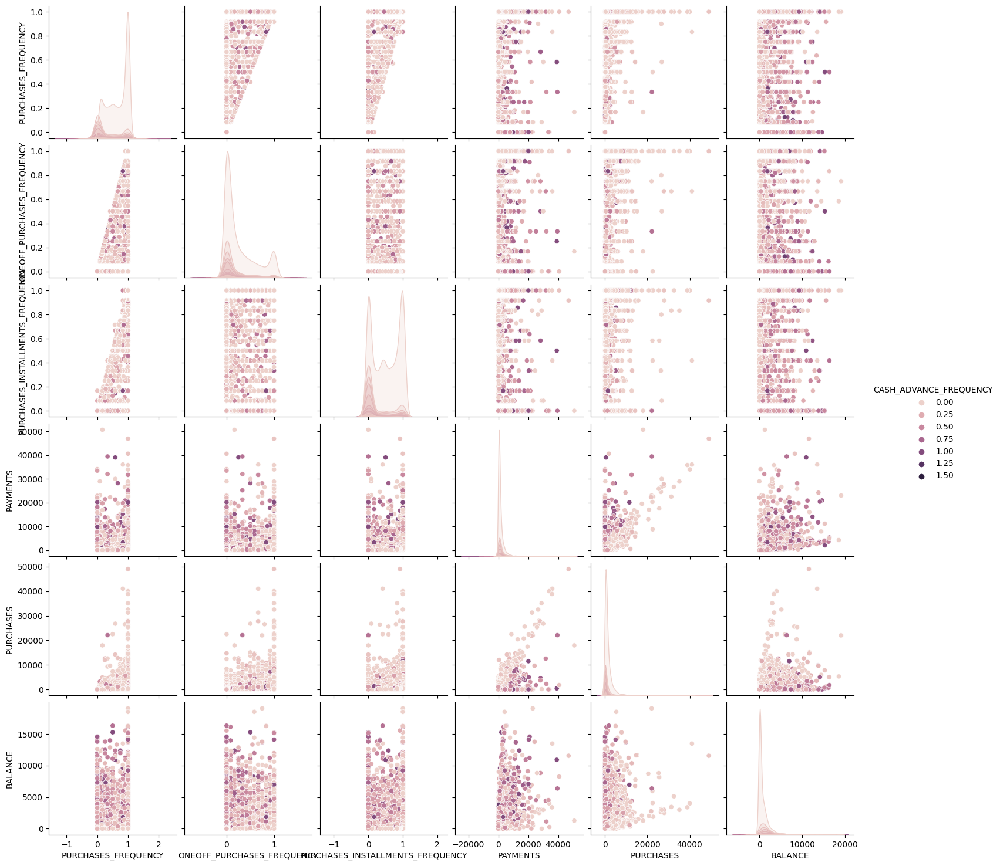

In [159]:
plot_scatter(assum1_selected_data, label="CASH_ADVANCE_FREQUENCY")

<Figure size 1500x1500 with 0 Axes>

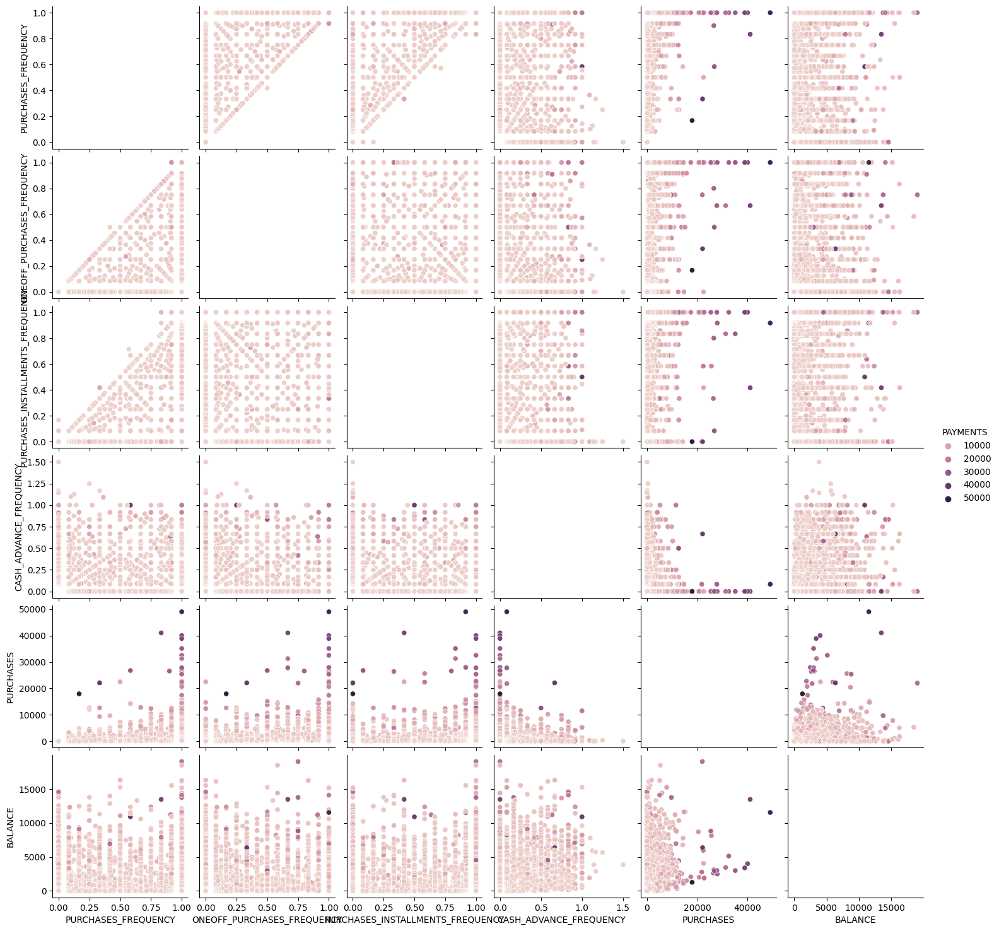

In [160]:
plot_scatter(assum1_selected_data, label="PAYMENTS")

<Figure size 1500x1500 with 0 Axes>

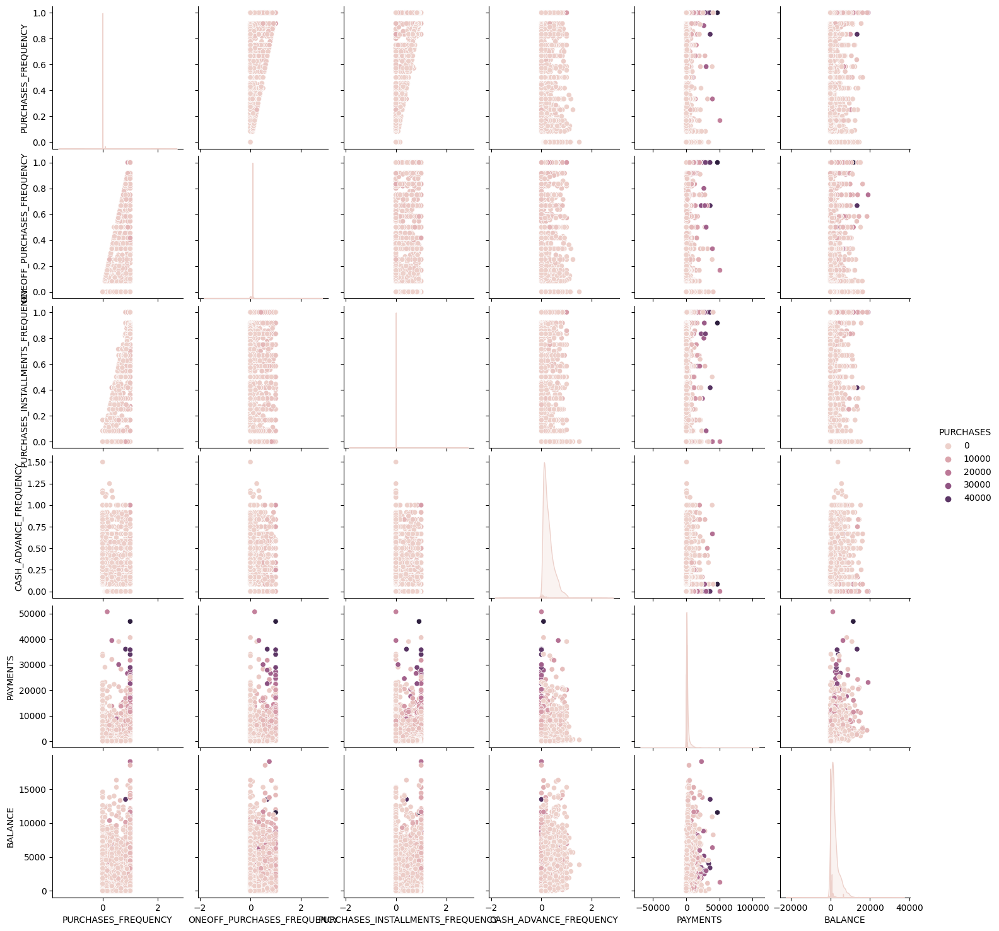

In [161]:
plot_scatter(assum1_selected_data, label="PURCHASES")

<Figure size 1500x1500 with 0 Axes>

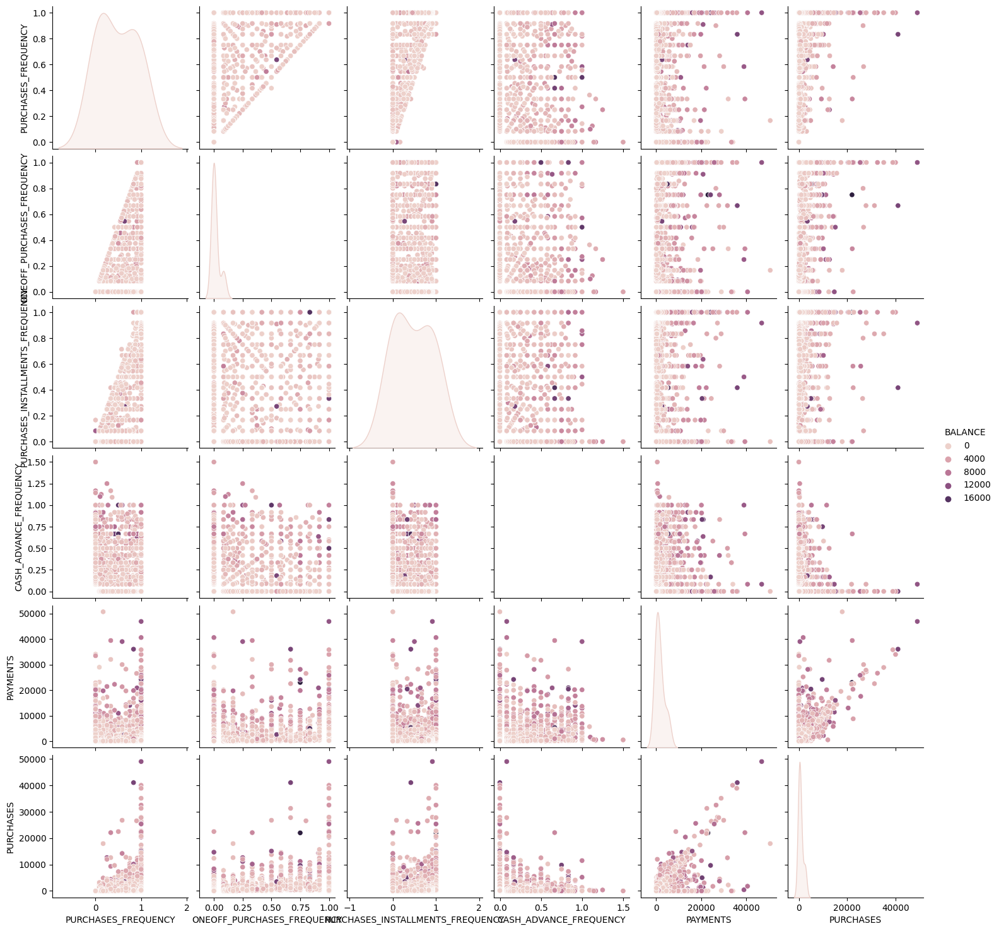

In [162]:
plot_scatter(assum1_selected_data, label="BALANCE")

From all scatter diagrams it shows that
- Customers with high PAYMENTS value tend to make high PURCHASES.
- Customers with high PAYMENTS value tend to have high BALANCE.
- Customers with low PURCHASES value tend to have CASH_ADVANCE_FREQUENCY higher than customers with high PURCHASES.
- Customers with low PURCHASES value tend to have ONEOFF_PURCHASES_FREQUENCY higher than customers with low PURCHASES_INSTALLMENTS_FREQUENCY3
- Customers with high BALANCE tend to have high ONOFF_PURCHASES_FREQUENCY and PURCHASES_INSTALLMENTS_FREQUENCY.
- Valuable customers PURCHASES_FREQUENCY high usually be valuable customers PURCHASES high.
- Valuable customers PURCHASES_FREQUENCY high usually be valuable customers PURCHASES_INSTALLMENTS_FREQUENCY high.

-----------------------------------------------------------------------------------------------------------------

#### DATA PREPROCESSING

In the pre-processing stage We simply scale the data using the MinMax Scaler to equalize the boundaries of the data.

In [241]:
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
assum1_scaled_data = min_max_scaler.fit_transform(assum1_selected_data)
assum1_dataset = pd.DataFrame(assum1_scaled_data, columns = assum1_selected_data.columns)
assum1_dataset_path = os.path.join(dataset_path, "assumption_1_dataset.csv")
assum1_dataset.to_csv(assum1_dataset_path, index=False)
assum1_dataset.describe()

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,0.496000,0.205909,0.368820,0.091736,0.035181,0.020910,0.084084
std,0.401273,0.300054,0.398093,0.134528,0.057368,0.044191,0.110043
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.083333,0.000000,0.000000,0.000000,0.008251,0.000884,0.007777
50%,0.500000,0.083333,0.166667,0.000000,0.017677,0.007655,0.048146
75%,0.916667,0.333333,0.750000,0.166667,0.038467,0.023368,0.110549
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


------------------------------------------------------------------------------------------

#### Assumption 2

<font size="3">
From the correlation value in data table and data pairing plot, we know that data is low correlation, non-grouped data and there is many out-liner data.
</font>

------------------------------------------------------------------------------------------

#### Assumption 3

<font size="3">
Credit limit, balance, volume, and frequency of major forms of credit card usage. Able to classify customer behavior and financial background.
</font>

------------------------------------------------------------------------------------------

# Data Analytics

## Library for data analytics

In [173]:
from sklearn.cluster import KMeans
from sklearn import metrics
import plotly.express as px
import warnings

## Function for Data Analytics

In [237]:
def model_result_linepolar(data, label):
    plot = pd.melt(data, id_vars=[label])
    fig = px.line_polar(plot, r="value", theta="variable", color=label, line_close=True)
    fig.show()

## Model Buildeing

### Assumption 1 dataset clustering and analytics

#### Import Assumption 1 Dataset

In [242]:
assum_1_name = 'assumption_1_dataset.csv'
assum_1_dir = os.path.join(dataset_dir, assum_1_name)
assum_1_df = pd.read_csv(assum_1_dir)
assum_1_df.describe()

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,0.496000,0.205909,0.368820,0.091736,0.035181,0.020910,0.084084
std,0.401273,0.300054,0.398093,0.134528,0.057368,0.044191,0.110043
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.083333,0.000000,0.000000,0.000000,0.008251,0.000884,0.007777
50%,0.500000,0.083333,0.166667,0.000000,0.017677,0.007655,0.048146
75%,0.916667,0.333333,0.750000,0.166667,0.038467,0.023368,0.110549
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Find Optimal Cluster Number

[1606.795285566303, 1063.1452213362818, 828.4118930104619, 648.7009970623172, 561.3912028578761, 505.74196393240925, 461.23029066801314, 430.74473007602353, 400.49440050606074]


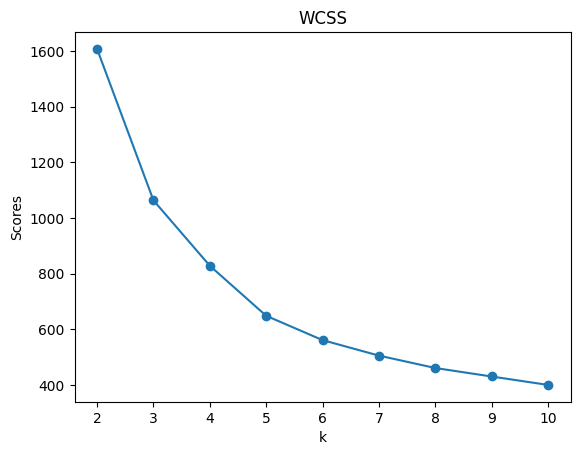

In [205]:
Num_K = [i+1 for i in range(1, 10)]
WCSS = []

for k in Num_K:
  kmeans = KMeans(n_clusters = k, random_state = 1,)
  model = kmeans.fit(assum_1_df)
  WCSS.append(model.inertia_)
print(WCSS)

plt.scatter(Num_K,WCSS )
plt.plot(Num_K,WCSS )
plt.title('WCSS')
plt.ylabel('Scores')
plt.xlabel('k')
plt.show()

จากการหาค่า k หรือ ค่า Optimal cluster number พบว่ามี ค่า Optimal cluster number ที่เหมาะสมที่สุดสำหรับวิธีการ Elbow method จะอยู่ที่ k = 3  

------------------------------------------------------------------------------------------

#### K Mean Clustering Model
หลังจากนั้นทำการสร้าง model โดยเลือกค่า k ที่เท่ากับ 3

In [211]:
kmeans = KMeans(n_clusters = 3, random_state = 1)
model = kmeans.fit(assum_1_df)

labels = pd.DataFrame(model.labels_, columns = ['label'])
labels

,label
0,1
1,1
2,0
3,1
4,2
...,...
8631,1
8632,2
8633,2
8634,1


- ทำการหาค่า silhouette score ที่เกิดขึ้น พบว่ามีค่าอยู่ที่ประมาณ 0.53

In [212]:
metrics.silhouette_score(assum_1_df, labels, metric='euclidean')

C:\Users\newth\AppData\Roaming\Python\Python39\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



0.5322505322117906

- ทำการดูตำแหน่งของจุด centroid ของแต่ละ feature ที่อยู่ในแต่ละ cluster

In [236]:
assam_1_centroid = pd.concat([pd.DataFrame(model.cluster_centers_, columns = [assum_1_df.columns]), pd.DataFrame([0, 1, 2], columns = ["label"])], axis=1)
assam_1_centroid

,"(PURCHASES_FREQUENCY,)","(ONEOFF_PURCHASES_FREQUENCY,)","(PURCHASES_INSTALLMENTS_FREQUENCY,)","(CASH_ADVANCE_FREQUENCY,)","(PAYMENTS,)","(PURCHASES,)","(BALANCE,)",label
0,0.889163,0.797859,0.475147,0.063983,0.063293,0.064508,0.100113,0
1,0.145984,0.081251,0.062833,0.126155,0.029989,0.006091,0.091577,1
2,0.876577,0.104433,0.826022,0.048591,0.029141,0.022888,0.063116,2


In [235]:
assum_1_cluster = pd.concat([assum_1_df, labels], axis=1)
assum_1_cluster

,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PAYMENTS,PURCHASES,BALANCE,label
0,0.166667,0.000000,0.083333,0.000000,0.003978,0.001945,0.002148,1
1,0.000000,0.000000,0.000000,0.166667,0.080892,0.000000,0.168169,1
2,1.000000,1.000000,0.000000,0.000000,0.012263,0.015766,0.131026,0
3,0.083333,0.083333,0.000000,0.000000,0.013373,0.000326,0.042940,1
4,0.666667,0.000000,0.583333,0.000000,0.027602,0.027188,0.095038,2
...,...,...,...,...,...,...,...,...
8631,0.166667,0.166667,0.000000,0.000000,0.001155,0.000426,0.000308,1
8632,1.000000,0.000000,0.833333,0.000000,0.006418,0.005936,0.001496,2
8633,0.833333,0.000000,0.666667,0.000000,0.001601,0.002945,0.001229,2
8634,0.000000,0.000000,0.000000,0.111111,0.001035,0.000000,0.000707,1


In [216]:
assam_1_behavior_1 = assum_1_cluster[assum_1_cluster["label"] == 0]
assam_1_behavior_2 = assum_1_cluster[assum_1_cluster["label"] == 1]
assam_1_behavior_3 = assum_1_cluster[assum_1_cluster["label"] == 2]

จากการดูตำแหน่งของจุด Centroid พบว่า
- Cluster 1 : จะมี feature ONEOFF_PURCHASES_FREQUENCY และ PURCHASES_INSTALLMENTS_FREQUENCY ที่มีตำแหน่งที่แตกต่างกับจุด centroid ของ feature อื่น ซึ่งเป็น feature ที่สำคัญในการแบ่ง cluster 1
- Cluster 2 : จะมี feature PURCHASES_FREQUENCY และ PURCHASES_INSTALLMENTS_FREQUENCY ที่มีตำแหน่งที่แตกต่างกับจุด centroid ของ feature อื่นอย่างชัดเจน ซึ่งเป็น feature ที่สำคัญในการแบ่ง cluster 2
- Cluster 3 : จะมี feature PURCHASES_INSTALLMENTS_FREQUENCY, PAYMENTS และ PERCHASES ที่มีตำแหน่งที่แตกต่างกับจุด centroid ของ feature อื่นอย่างชัดเจน ซึ่งเป็น feature ที่สำคัญในการแบ่ง cluster 3

<Figure size 1500x1500 with 0 Axes>

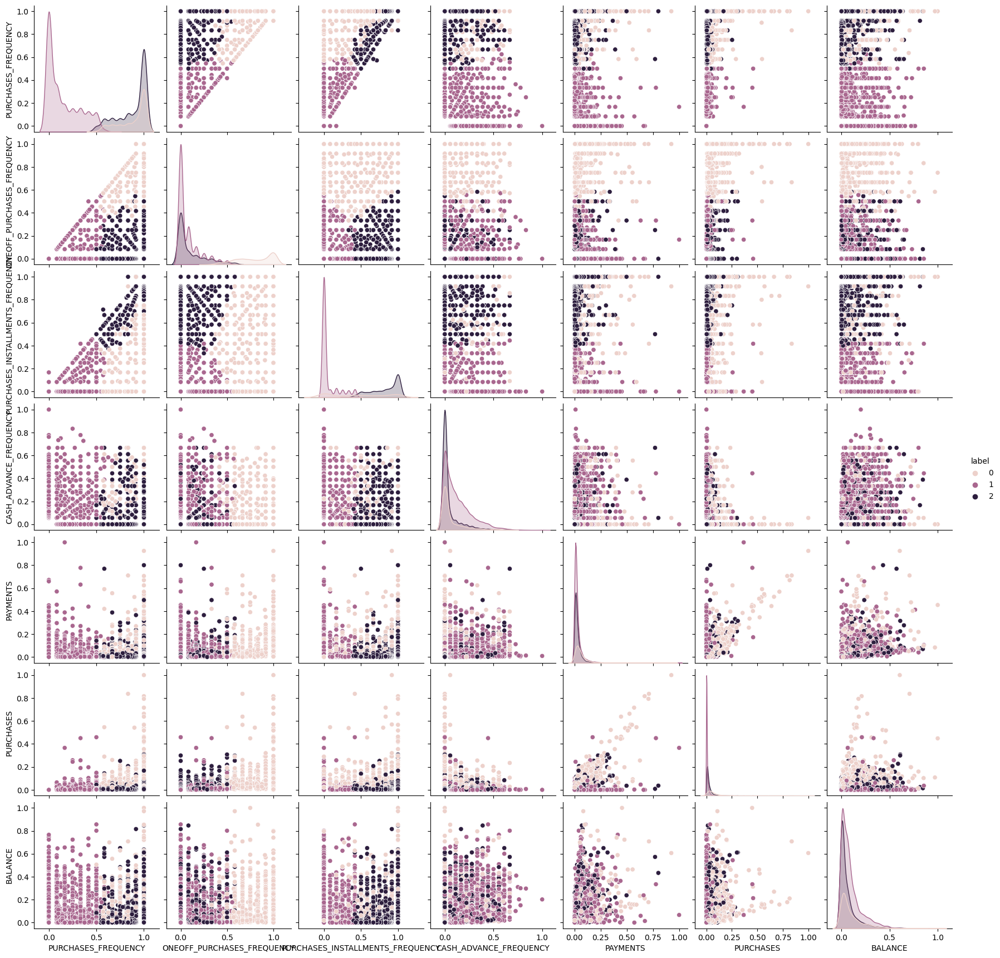

In [217]:
plot_scatter(assum_1_cluster, label='label')

In [240]:
model_result_linepolar(assam_1_centroid, 'label')

จากการทำการ plot กราฟเพื่อดูลักษณะการแบ่งกลุ่มของ cluster ทั้งหมด 3 cluster พบว่า การแบ่ง cluster มีลักษณะเป็นไปตามตำแหน่งของจุด centroid ของแต่ละ feature ที่ได้มีการวิเคราะห์ไปก่อนหน้านี้ 
- cluster 1 จะเป็น cluster ที่มี 
    - ONEOFF_PURCHASES_FREQUENCY น้อยกว่า 0.5 
    - PURCHASES_INSTALLMENTS_FREQUENCY มากกว่า 0.5 
    - PURCHASES_FREQUENCY มากกว่า 0.5
    - PURCHASES ปานปลาง
- cluster 2 จะเป็น cluster ที่มี 
    - ONEOFF_PURCHASES_FREQUENCY น้อยกว่า 0.5 
    - PURCHASES_INSTALLMENTS_FREQUENCY น้อยกว่า 0.5
    - PURCHASES_FREQUENCY น้อยกว่า 0.5
    - PURCHASES ต่ำ
- cluster 3 จะเป็น cluster ที่มี 
    - ONEOFF_PURCHASES_FREQUENCY มากกว่า 0.5 
    - PURCHASES_INSTALLMENTS_FREQUENCY น้อยไปจนถึงมาก
    - PURCHASES_FREQUENCY มากกว่า 0.5
    - PURCHASES สูง

ซึ่งจากรูปแบบกราฟของแต่ละ cluster ทีไ่ด้กล่าวมาสามารถวิเคราะห์ถึงลักษณะการใช้จ่ายเงินของแต่ละบุคคลในแต่ละ cluster ได้ว่า 
- cluster 1 เป็นกลุ่มคนที่มีค่าใช้จ่ายปานกลาง แต่มีความถี่ในการใช้จ่ายเงินที่ค่อนข้างมาก และมักจะมีลักษณะของการใช้จ่ายที่เป็นแบบผ่อนมากกว่าการจ่ายแบบทีเดียว
- cluster 2 เป็นกลุ่มคนที่มีค่าใช้จ่ายน้อย มีความถี่ในการใช้จ่ายเงินที่น้อย และมีลักษณะการใช้จ่ายที่เป็นแบบจ่ายทีเดียวและแบบผ่อนที่มีความใกล้เคียงกัน
- cluster 3 เป็นกลุ่มคนที่มีค่าใช้จ่ายที่สูง แต่มีความถี่ในการใช้จ่ายเงินที่มากและมากกว่ากลุ่มคนใน cluster 1 และมีลักษณะการใช้จ่ายที่เน้นเป็นแบบของการจ่ายทีเดียว ส่วนลักษณะของการจ่ายแบบผ่อนจะขึ้นอยู่กับแต่ละบุคคลโดยจะมีตั้งแต่น้อยไปจนถึงมาก

#### Assumption 2

#### Assumption 3

## Summary Information